In [3]:
!pip install -U huggingface_hub transformers datasets soundfile torch moviepy imageio imageio-ffmpeg

In [6]:
import os
print(os.getcwd())

C:\Users\pc


In [9]:
import sys
!"{sys.executable}" -m pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu

Looking in indexes: https://download.pytorch.org/whl/cpu


In [3]:
import sys
!"{sys.executable}" -m pip show torch

Name: torch
Version: 2.14.0+cpu
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: 
Author: 
Author-email: PyTorch Team <packages@pytorch.org>
License: 
Location: C:\Users\pc\anaconda3\Lib\site-packages
Requires: filelock, fsspec, jinja2, networkx, setuptools, sympy, typing-extensions
Required-by: torchvision, ultralytics, ultralytics-thop


In [ ]:
import torch

print("Torch version:", torch.__version__)
print("Torch working:", torch.rand(2, 2))

In [1]:
import sys
print(sys.executable)

C:\Users\pc\anaconda3\envs\storyai\python.exe


In [5]:
import os
import torch
import soundfile as sf

from IPython.display import display, Audio, Video, Image
from huggingface_hub import login, whoami, InferenceClient
from transformers import pipeline
from datasets import load_dataset
from moviepy import ImageClip, VideoFileClip, AudioFileClip

print("✅ All imports successful")
print("Torch:", torch.__version__)

✅ All imports successful
Torch: 2.14.0+cpu


In [13]:
from huggingface_hub import login

login()

In [1]:
from huggingface_hub import HfApi

api = HfApi()
print("Hugging Face library working ✅")

Hugging Face library working ✅


In [19]:
import os

os.makedirs("generated_images", exist_ok=True)
os.makedirs("generated_audio", exist_ok=True)
os.makedirs("generated_videos", exist_ok=True)

print("✅ Folders created")

✅ Folders created


In [3]:
story = """
Once upon a time, a young girl named Mia lived in a beautiful village.
She loved exploring nature and helping everyone around her.
One day, she discovered a mysterious glowing forest.
She entered the forest and found a magical world full of colorful flowers and friendly animals.
Mia learned that courage and kindness can make even the biggest dreams come true.
"""

print("📖 Story ready!")
print(story)

📖 Story ready!

Once upon a time, a young girl named Mia lived in a beautiful village.
She loved exploring nature and helping everyone around her.
One day, she discovered a mysterious glowing forest.
She entered the forest and found a magical world full of colorful flowers and friendly animals.
Mia learned that courage and kindness can make even the biggest dreams come true.



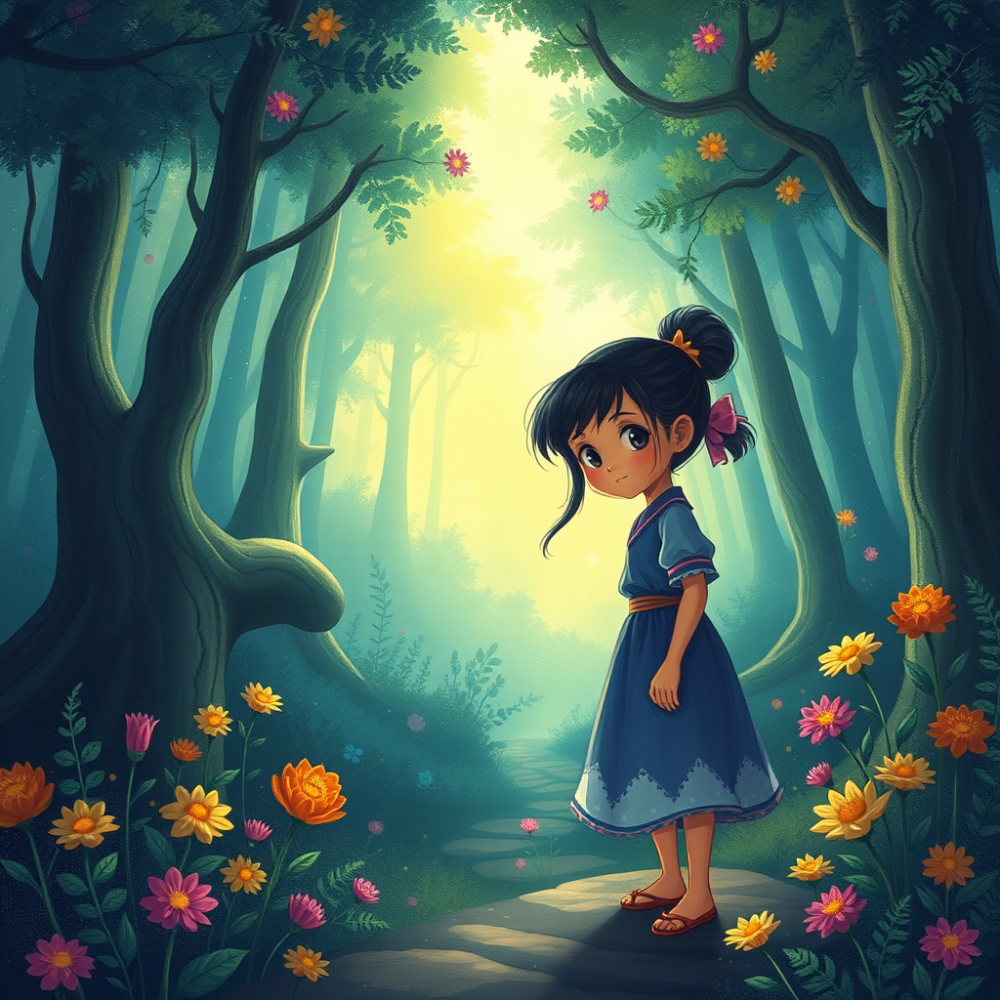

✅ Image generated successfully!
📁 File saved as generated_image.png


In [ ]:
from huggingface_hub import InferenceClient
from IPython.display import display

HF_TOKEN = "hf_YOUR_TOKEN_HERE"

client = InferenceClient(
    
    provider="auto",
    api_key="apply key "
)

image_prompt = """
Once upon a time, a young girl named Mia lived in a beautiful village.
She loved exploring nature and helping everyone around her.
One day, she discovered a mysterious glowing forest.
She entered the forest and found a magical world full of colorful flowers and friendly animals.
Mia learned that courage and kindness can make even the biggest dreams come true.

"""

image = client.text_to_image(
    prompt=image_prompt,
    model="black-forest-labs/FLUX.1-schnell"
)

display(image)

image.save("generated_image.png")

print("✅ Image generated successfully!")
print("📁 File saved as generated_image.png")

In [21]:


print("🖼️ Generating AI image...")

image = client.text_to_image(
    image_prompt,
    model="black-forest-labs/FLUX.1-schnell"
)

image_path = "generated_images/story_image.png"

image.save(image_path)

print("✅ Image generated!")
print("Saved:", image_path)

🖼️ Generating AI image...
✅ Image generated!
Saved: generated_images/story_image.png


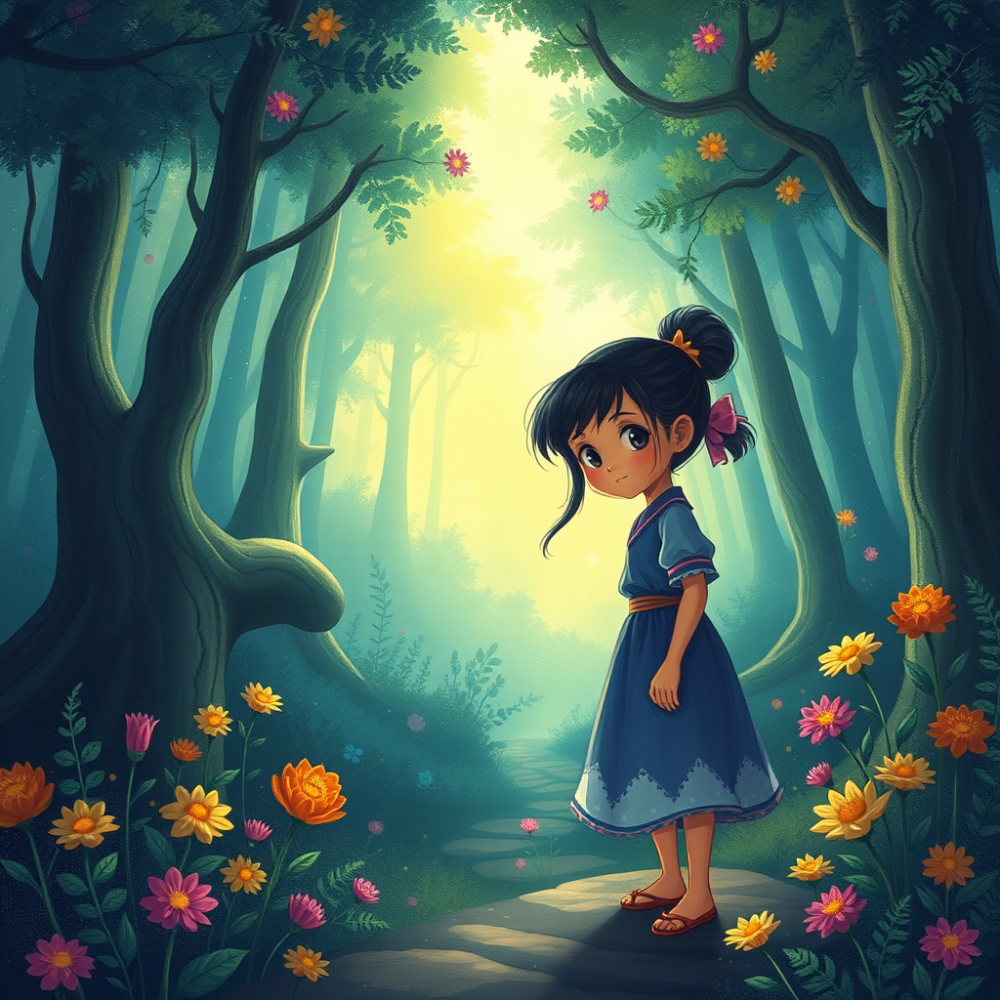

In [9]:
from IPython.display import display

display(image)

In [27]:
%pip install sentencepiece

Note: you may need to restart the kernel to use updated packages.


In [1]:
import torch
import soundfile as sf
from datasets import load_dataset
from transformers import (
    SpeechT5Processor,
    SpeechT5ForTextToSpeech,
    SpeechT5HifiGan
)

from IPython.display import Audio, display

print("✅ Imports successful!")

✅ Imports successful!


In [3]:
story = """
Once upon a time, a young girl named Mia lived in a beautiful village.
She loved exploring nature and helping everyone around her.
One day, she discovered a mysterious glowing forest.
She entered the forest and found a magical world full of colorful flowers and friendly animals.
Mia learned that courage and kindness can make even the biggest dreams come true.
"""

print("📖 Story ready!")

📖 Story ready!


In [5]:
print("🔊 Loading SpeechT5...")

processor = SpeechT5Processor.from_pretrained(
    "microsoft/speecht5_tts"
)

model = SpeechT5ForTextToSpeech.from_pretrained(
    "microsoft/speecht5_tts"
)

vocoder = SpeechT5HifiGan.from_pretrained(
    "microsoft/speecht5_hifigan"
)

print("✅ Voice model loaded!")

🔊 Loading SpeechT5...


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

[transformers] SpeechT5ForTextToSpeech LOAD REPORT from: microsoft/speecht5_tts
Key                                         | Status     |  | 
--------------------------------------------+------------+--+-
speecht5.encoder.prenet.encode_positions.pe | UNEXPECTED |  | 
speecht5.decoder.prenet.encode_positions.pe | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
[transformers] You are using a model of type `hifigan` to instantiate a model of type `speecht5_hifigan`. This may be expected if you are loading a checkpoint that shares a subset of the architecture (e.g., loading a `sam2_video` checkpoint into `Sam2Model`), but is otherwise not supported and can yield errors. Please verify that the checkpoint is compatible with the model you are instantiating.


Loading weights:   0%|          | 0/158 [00:00<?, ?it/s]

✅ Voice model loaded!


In [7]:
print("🔊 Loading speaker voice...")

embeddings_dataset = load_dataset(
    "Matthijs/cmu-arctic-xvectors",
    split="validation"
)

speaker_embeddings = torch.tensor(
    embeddings_dataset[7306]["xvector"]
).unsqueeze(0)

print("✅ Speaker voice ready!")

🔊 Loading speaker voice...


Using the latest cached version of the dataset since Matthijs/cmu-arctic-xvectors couldn't be found on the Hugging Face Hub
Found the latest cached dataset configuration 'default' at C:\Users\pc\.cache\huggingface\datasets\Matthijs___cmu-arctic-xvectors\default\0.0.1\5c1297a9eb6c91714ea77c0d4ac5aca9b6a952e5 (last modified on Fri Sep 18 19:56:17 2026).


✅ Speaker voice ready!


In [9]:
print("🎙️ Narrating story...")

inputs = processor(
    text=story,
    return_tensors="pt"
)

with torch.no_grad():
    speech = model.generate_speech(
        inputs["input_ids"],
        speaker_embeddings=speaker_embeddings,
        vocoder=vocoder
    )

audio = speech.cpu().numpy()

audio_path = "story_narration.wav"

sf.write(
    audio_path,
    audio,
    16000
)

print("✅ Story narration completed!")

display(Audio(audio_path, autoplay=False))

🎙️ Narrating story...
✅ Story narration completed!


In [23]:
from moviepy import ImageClip, AudioFileClip
from IPython.display import Video, display

print("🎬🔊 Creating video with voice...")

image_path = "generated_image.png"
audio_path = "story_narration.wav"
final_video_path = "generated_videos/final_ai_story.mp4"

# Load audio
audio_clip = AudioFileClip(audio_path)

print("🔊 Audio duration:", audio_clip.duration)

# Create image video with EXACT audio duration
video_clip = ImageClip(
    image_path,
    duration=audio_clip.duration
)

# Attach audio
final_video = video_clip.with_audio(audio_clip)

# Export
final_video.write_videofile(
    final_video_path,
    fps=24,
    codec="libx264",
    audio_codec="aac",
    temp_audiofile="generated_videos/temp_audio.m4a",
    remove_temp=True
)

print("✅ FINAL VIDEO WITH VOICE CREATED!")

display(Video(final_video_path, embed=True))

🎬🔊 Creating video with voice...
🔊 Audio duration: 24.13
MoviePy - Building video generated_videos/final_ai_story.mp4.
MoviePy - Writing audio in generated_videos/temp_audio.m4a


MoviePy - Done.
MoviePy - Writing video generated_videos/final_ai_story.mp4



MoviePy - Done !
MoviePy - video ready generated_videos/final_ai_story.mp4
✅ FINAL VIDEO WITH VOICE CREATED!


In [25]:
print("🎉 AI STORY GENERATED SUCCESSFULLY!")

🎉 AI STORY GENERATED SUCCESSFULLY!
